# Multi-Type-TD-TSR Demo Notebook
## 1. Install all the prerequisite


In [1]:
# install dependencies:
!pip install pyyaml==5.1
!pip install torch==1.7
!pip install torchvision==0.8.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions

!sudo apt install tesseract-ocr
!pip install pytesseract

import torch, torchvision
torch.__version__
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
ERROR: Could not find a version that satisfies the requirement torch==1.7 (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1)
ERROR: No matching distribution found for torch==1.7
ERROR: Ignored the following yanked versions: 0.1.6, 0.1.7, 0.1.8, 0.1.9, 0.2.0, 0.2.1, 0.2.2, 0.2.2.post2, 0.2.2.post3, 0.15.0
ERROR: Could not find a version that satisfies the requirement t

AssertionError: 

## 2. Clone the Repository

In [2]:
!git clone https://github.com/Psarpei/Multi-Type-TD-TSR.git
!mv Multi-Type-TD-TSR/ Multi_Type_TD_TSR

Cloning into 'Multi-Type-TD-TSR'...
remote: Enumerating objects: 302, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 302 (delta 65), reused 61 (delta 59), pack-reused 228 (from 1)
Receiving objects: 100% (302/302), 17.19 MiB | 12.01 MiB/s, done.
Resolving deltas: 100% (168/168), done.


## 3. Download Table Detection Weights and Configuration File

In [3]:
!gdown --id 11FgFTy0MyVUMGd00T_InEDaarB4qAlP8
!gdown --id 1WBk6kHHyvyEzoPBsRr2BvFY51zURjd4R
!gdown --id 1PfA2uws919gc893-x9uMIz06zWEko8nF

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=11FgFTy0MyVUMGd00T_InEDaarB4qAlP8
From (redirected): https://drive.google.com/uc?id=11FgFTy0MyVUMGd00T_InEDaarB4qAlP8&confirm=t&uuid=8eb561e0-8b21-4208-8ef5-6d71b80de04a
To: /content/model_final.pth
100% 1.10G/1.10G [00:22<00:00, 49.0MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1WBk6kHHyvyEzoPBsRr2BvFY51zURjd4R
To: /content/All_X152.yaml
100% 534/534 [00:00<00:00, 2.74MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecate

## 4. Import Everything

In [5]:
!pip install torch torchvision torchaudio
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-jl17zloz
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-jl17zloz
  Resolved https://github.com/facebookresearch/detectron2.git to commit 754469e176b224d17460612bdaa2cb8112b04cd9
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 48.9 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

In [6]:
import detectron2
import Multi_Type_TD_TSR.google_colab.deskew as deskew
import Multi_Type_TD_TSR.google_colab.table_detection as table_detection
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_all as tsra
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_lines as tsrl
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_wol as tsrwol
import Multi_Type_TD_TSR.google_colab.table_structure_recognition_lines_wol as tsrlwol
import Multi_Type_TD_TSR.google_colab.table_xml as txml
import Multi_Type_TD_TSR.google_colab.table_ocr as tocr
import pandas as pd
import os
import json
import itertools
import random
from detectron2.utils.logger import setup_logger
# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog, MetadataCatalog
from google.colab.patches import cv2_imshow
setup_logger()

<Logger detectron2 (DEBUG)>

## 5. Initialize Table Detection Detector

In [7]:
#create detectron config
cfg = get_cfg()

#set yaml
cfg.merge_from_file('/content/All_X152.yaml')

#set model weights
cfg.MODEL.WEIGHTS = '/content/model_final.pth' # Set path model .pth

predictor = DefaultPredictor(cfg)

[11/20 16:34:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

#Table Rotation

ORIGINAL IMAGE:


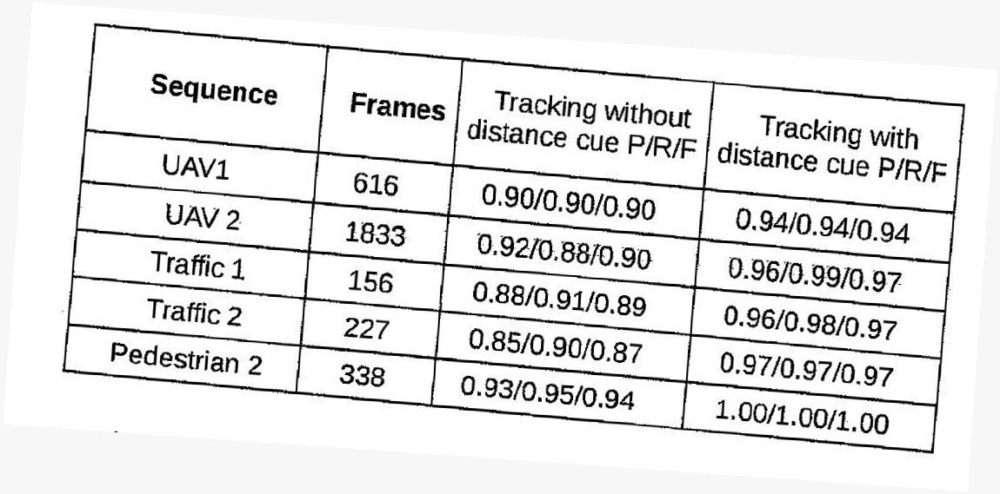


DESKEWED IMAGE:


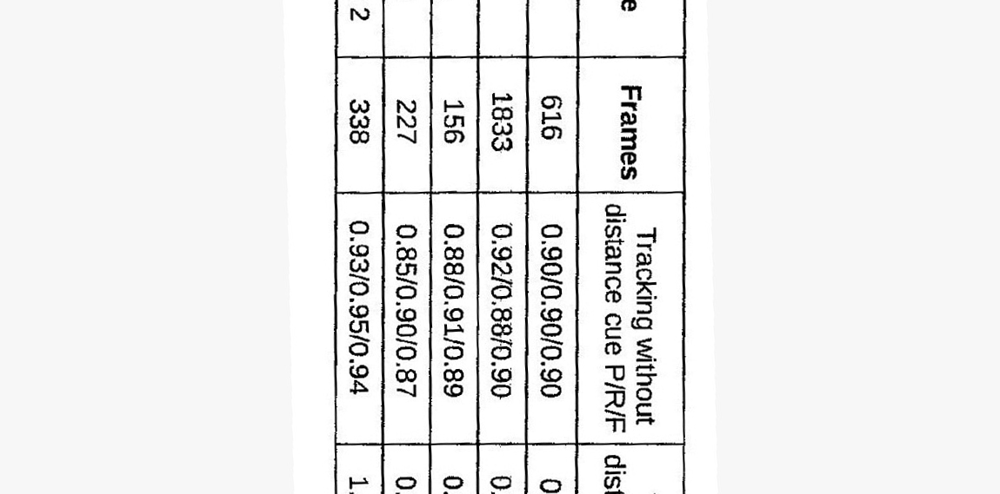

In [8]:
# path to the image scan of the document
file = "/content/Multi_Type_TD_TSR/images/rotated_example.jpeg"

# load the image from disk
original_image = cv2.imread(file)
deskewed_image = deskew.deskewImage(original_image)

print("ORIGINAL IMAGE:")
cv2_imshow(original_image)

print()

print("DESKEWED IMAGE:")
cv2_imshow(deskewed_image)

# Table Detection

/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


TABLE DETECTION:


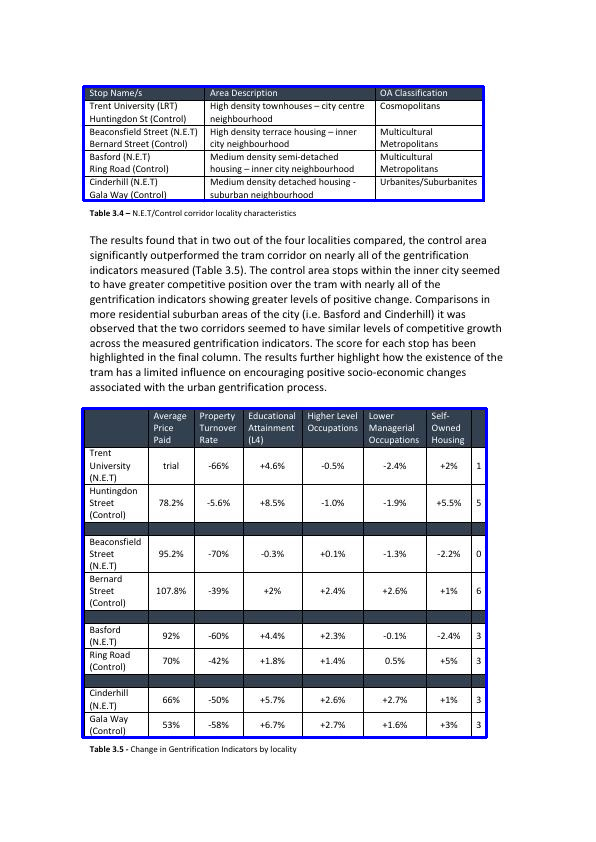

In [9]:
document_img = cv2.imread("/content/Multi_Type_TD_TSR/images/color_invariance_example.jpg")
table_detection.plot_prediction(document_img, predictor)


TABLE 0 :


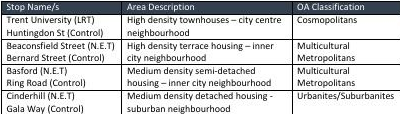


TABLE 1 :


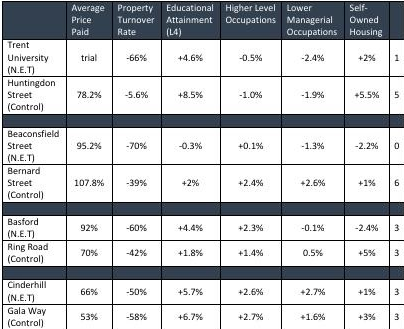

In [10]:
table_list, table_coords = table_detection.make_prediction(document_img, predictor)

#Table Structure Recognition Partially Bordered Tables
# with Color Invariance Pre-Processing

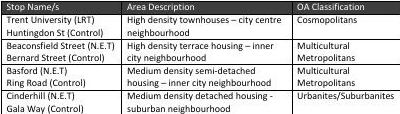

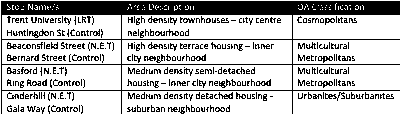

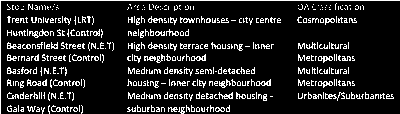

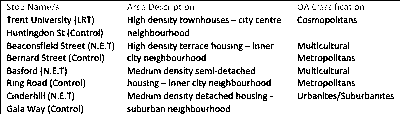

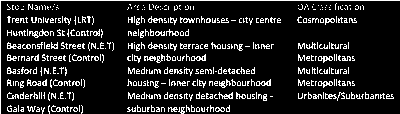

...

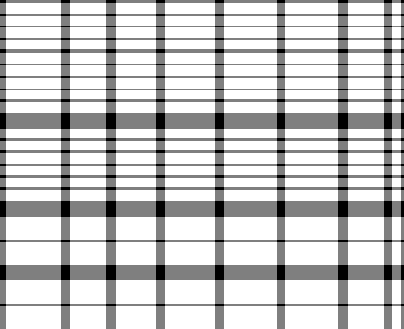

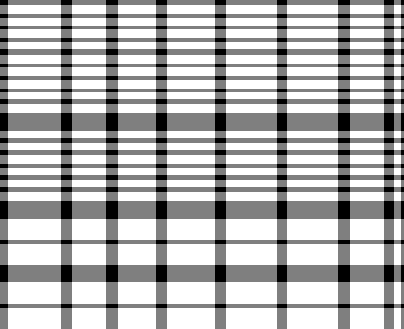

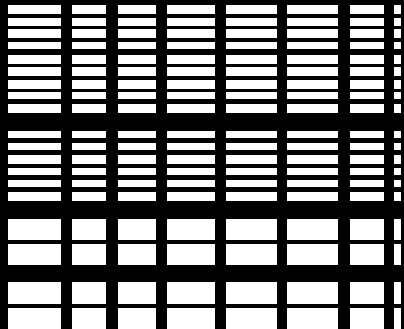

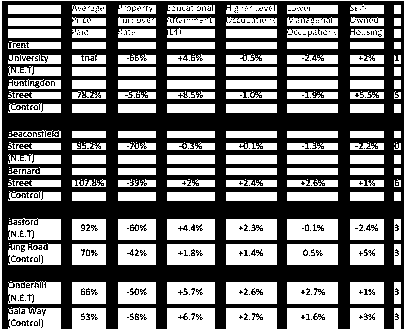

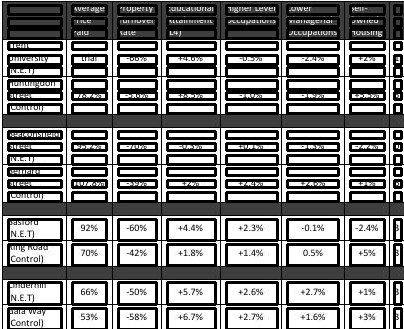

In [11]:
list_table_boxes = []

for table in table_list:
    finalboxes, output_img = tsra.recognize_structure(table)
    list_table_boxes.append(finalboxes)

# XML Output

In [12]:
txml.output_to_xml(table_coords, list_table_boxes)

#Table Structure Recognition Bordered Tables

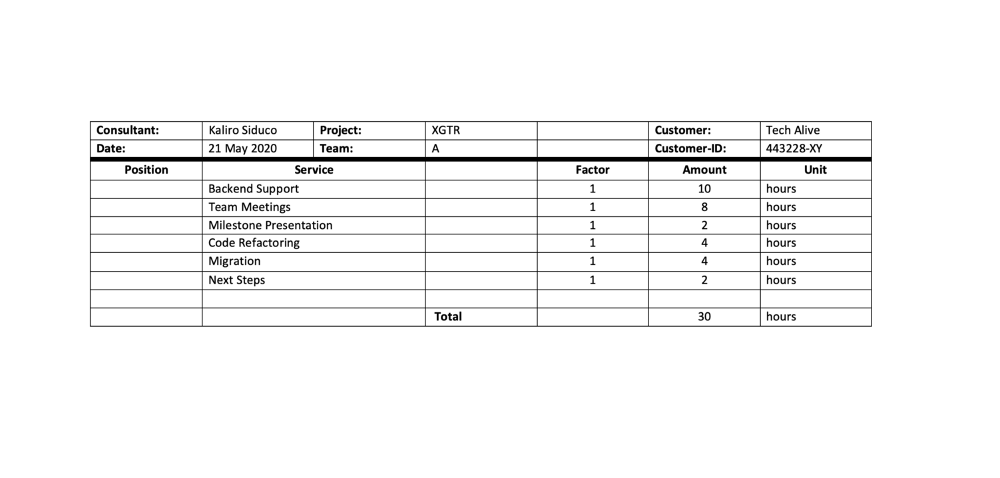

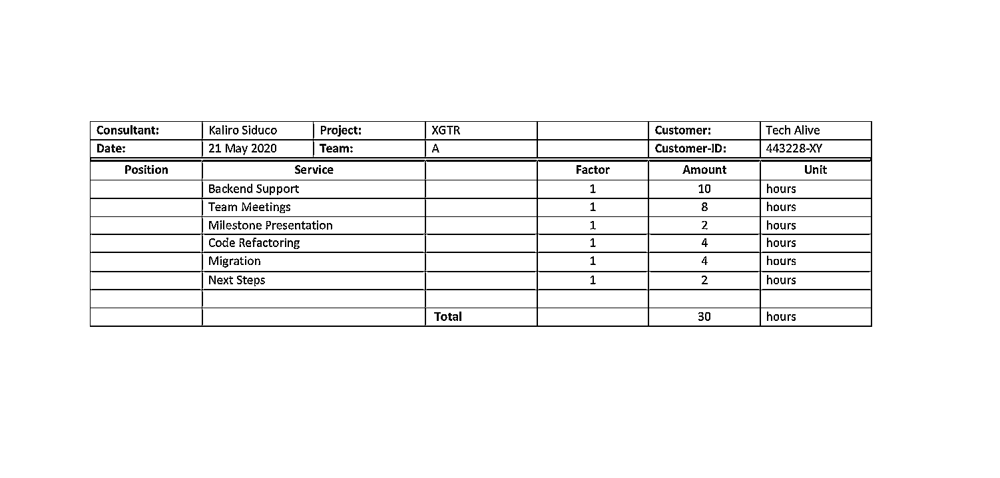

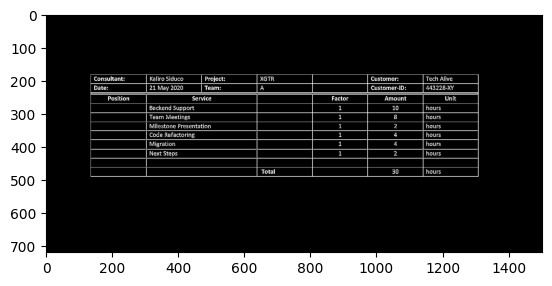

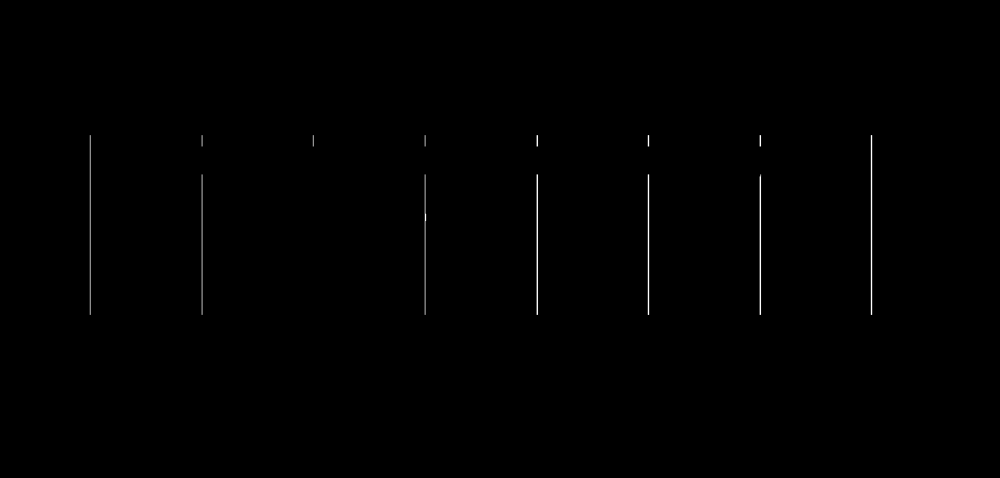

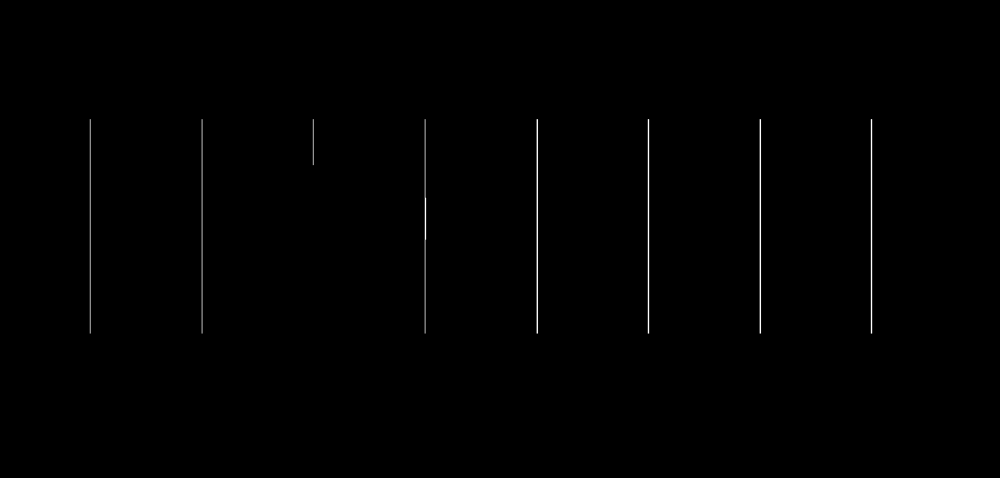

...

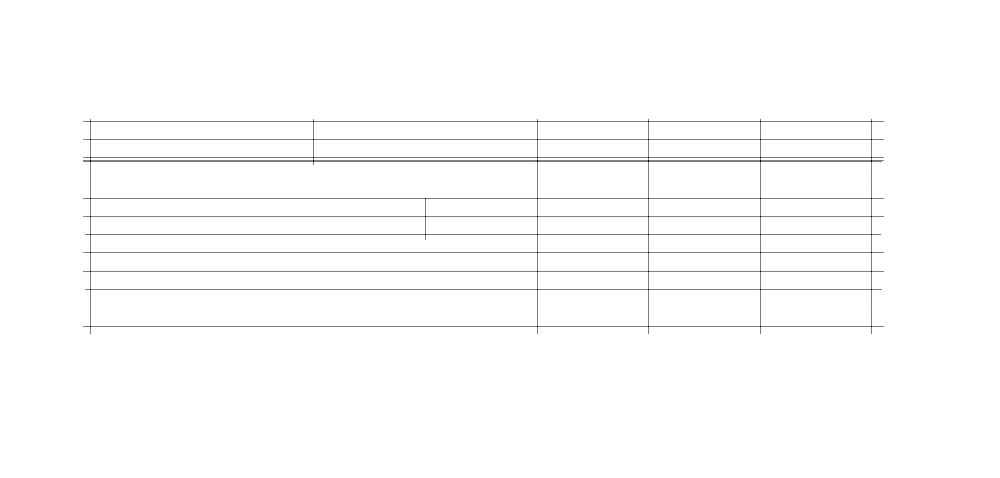

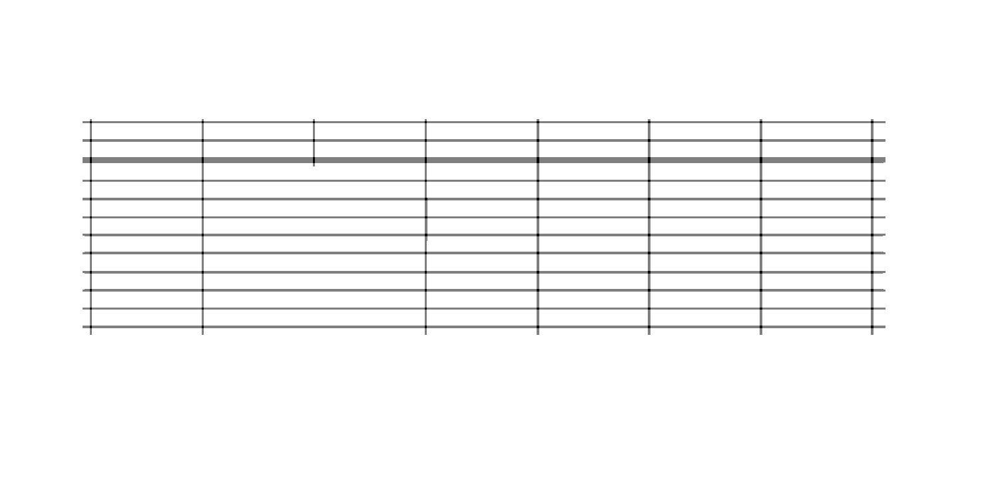

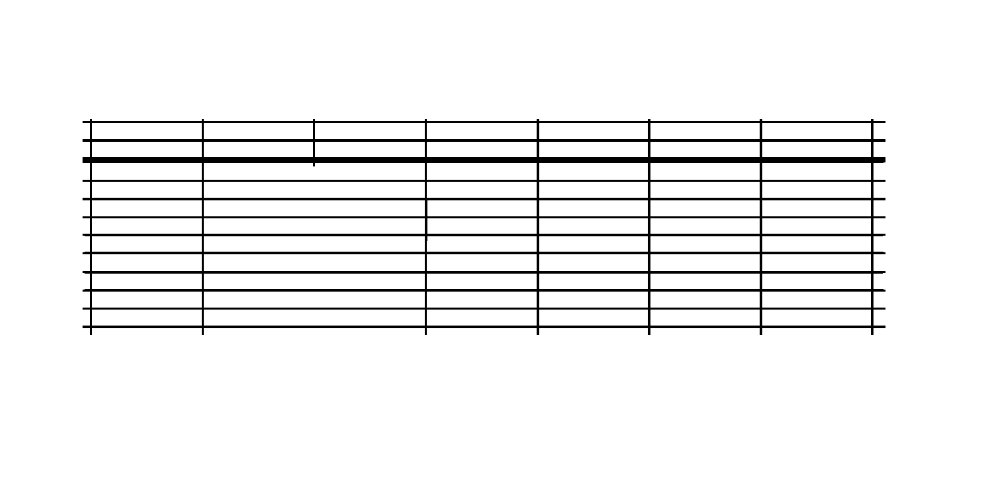

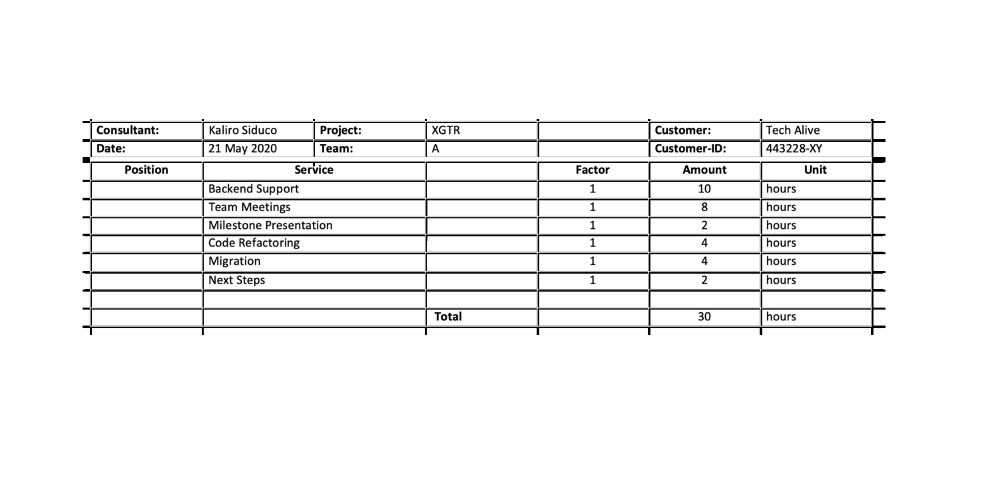

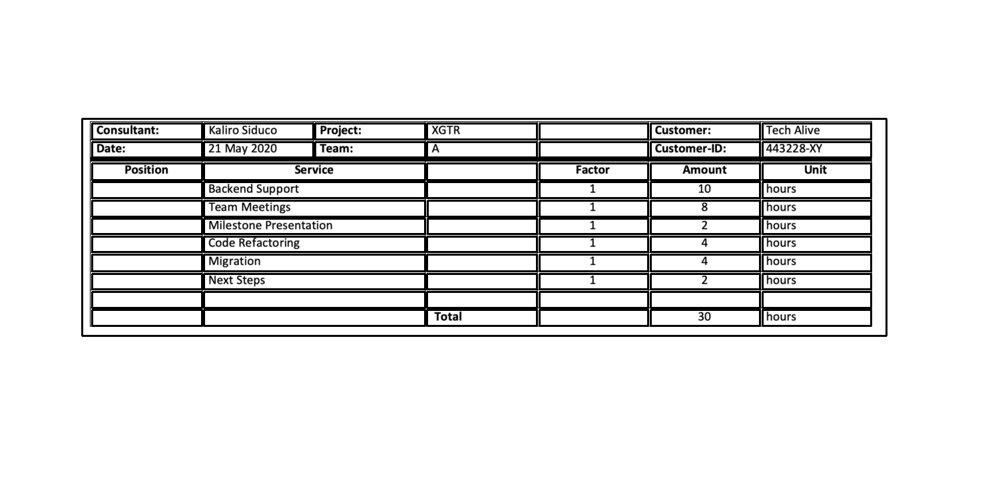

In [13]:
bordered_table = cv2.imread("/content/Multi_Type_TD_TSR/images/bordered_example.png")
list_table_boxes = []

table_list = [bordered_table]

for table in table_list:
    finalboxes, output_img = tsrl.recognize_structure(table)
    list_table_boxes.append(finalboxes)

# Table Structure Recognition Unbordered Tables

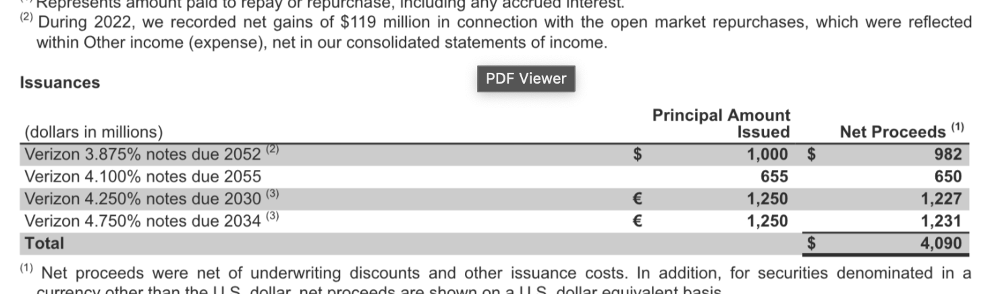

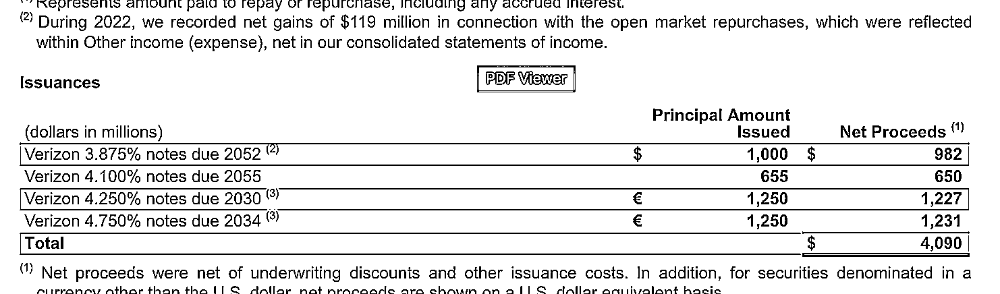

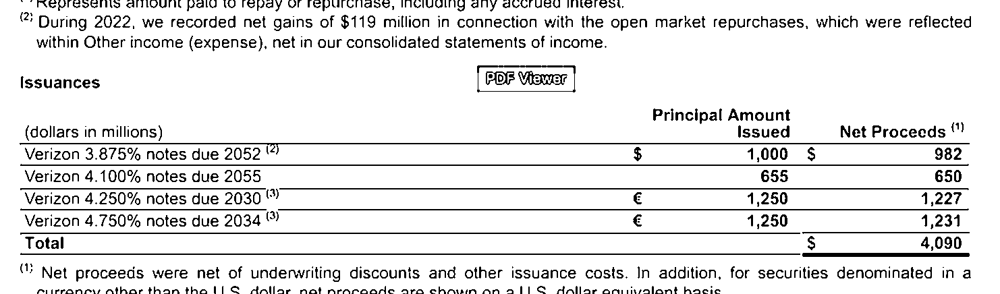

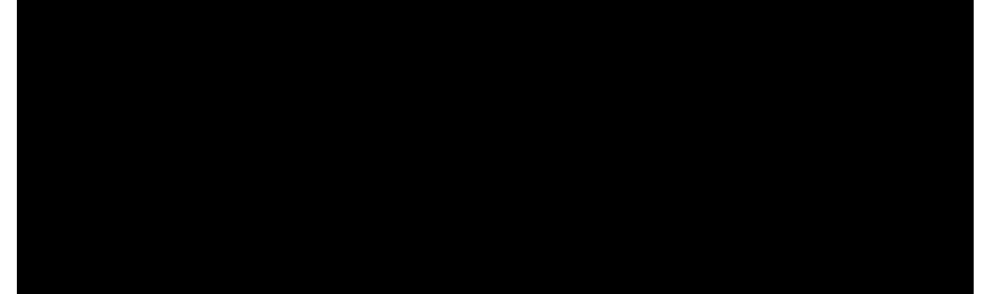

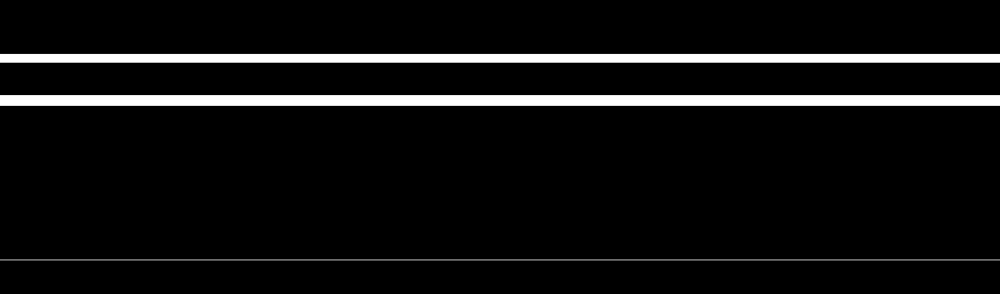

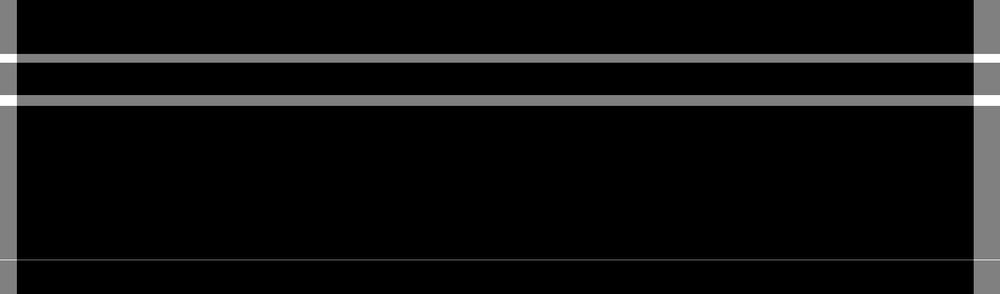

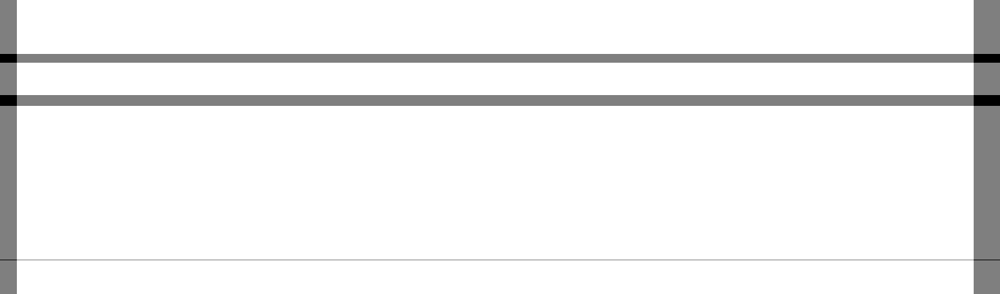

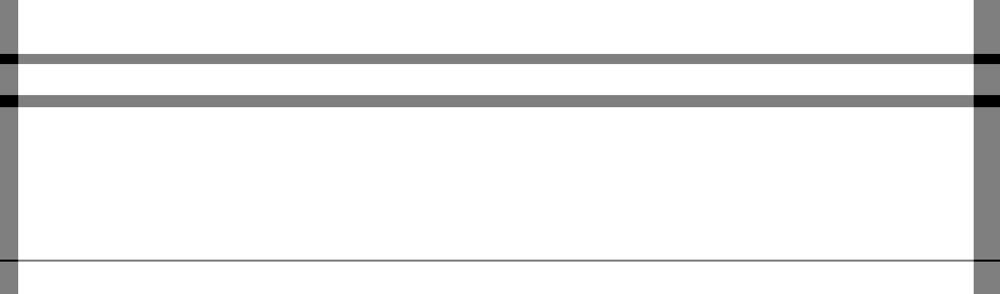

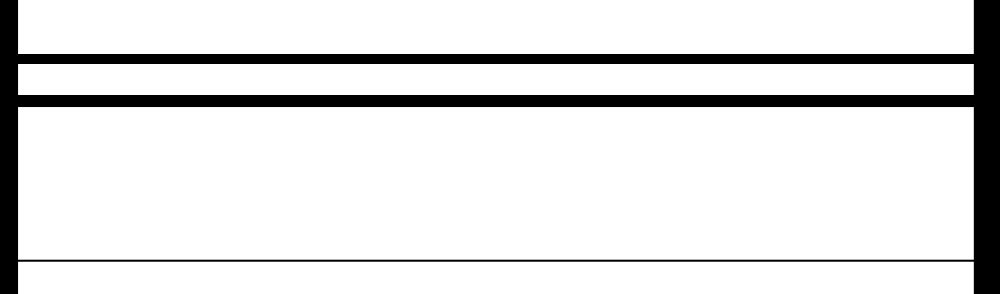

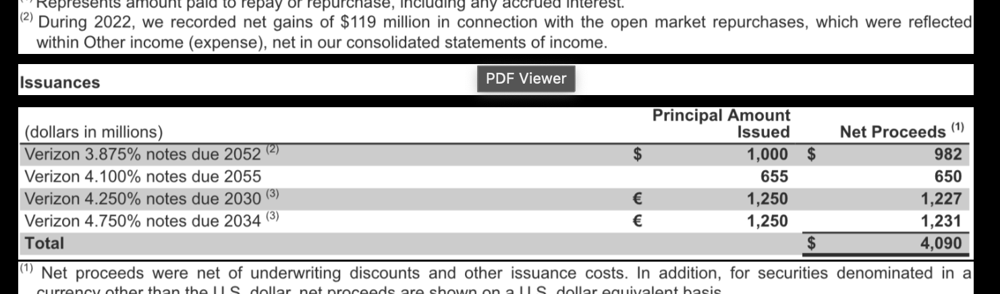

IndexError: list index out of range

In [21]:
unbordered_table = cv2.imread("/content/Multi_Type_TD_TSR/images/Screenshot 2024-11-20 at 10.16.32 PM.png")
list_table_boxes = []

table_list = [unbordered_table]

for table in table_list:
    finalboxes, output_img = tsrwol.recognize_structure(table)
    list_table_boxes.append(finalboxes)

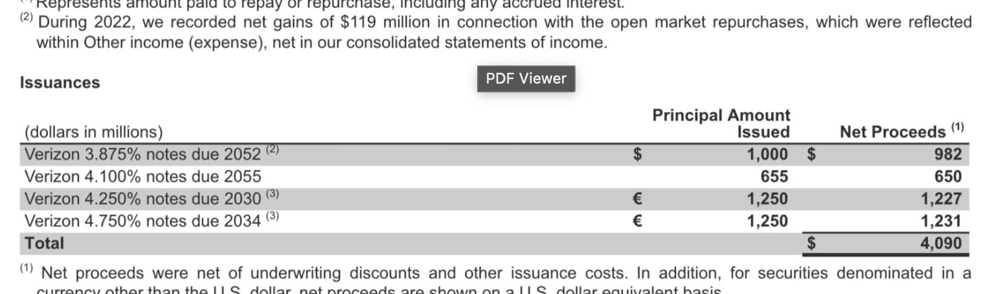

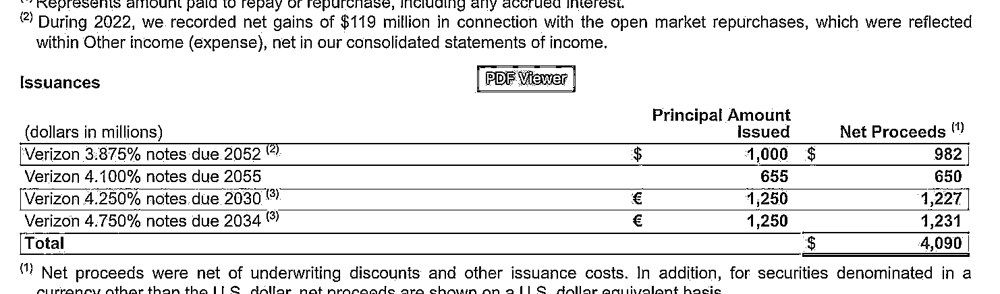

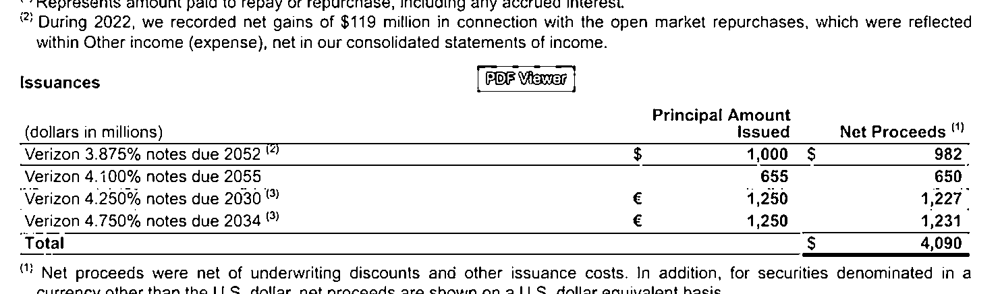

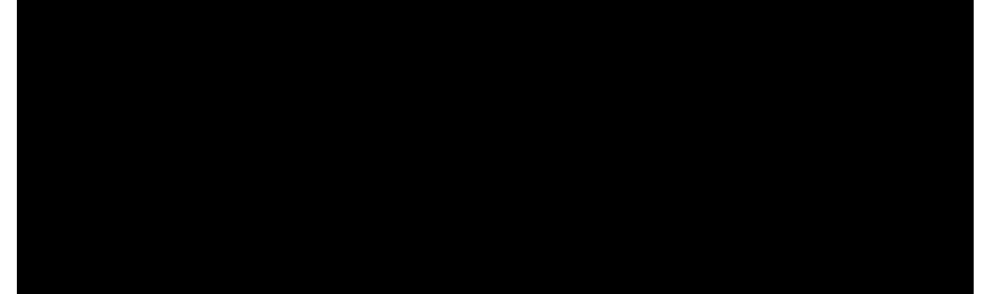

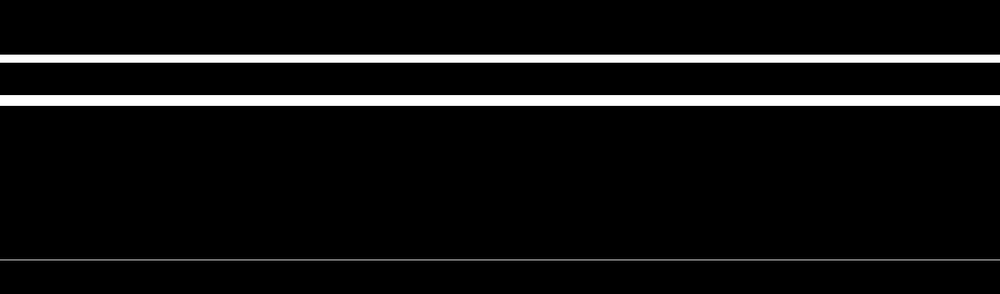

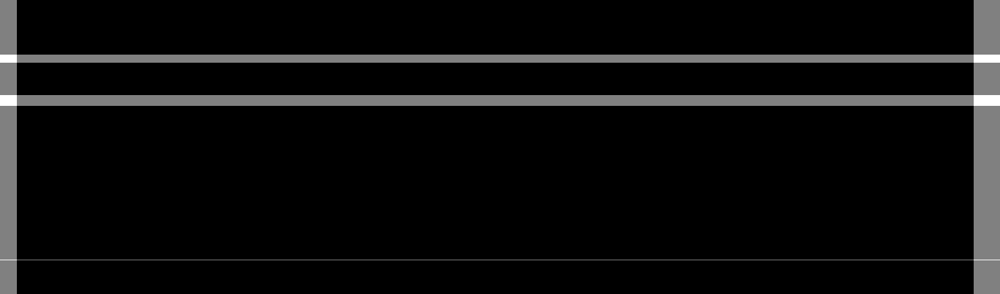

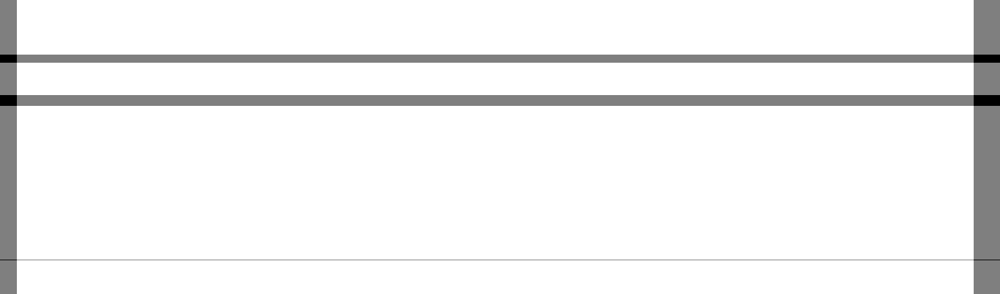

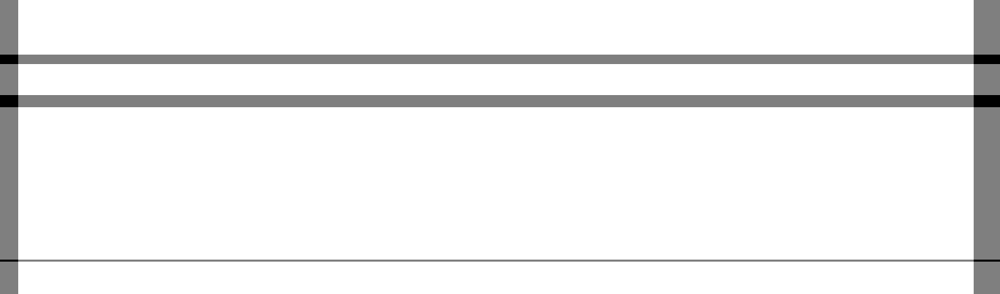

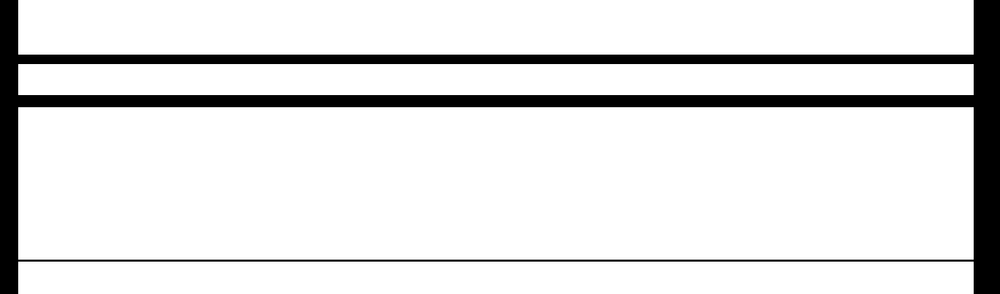

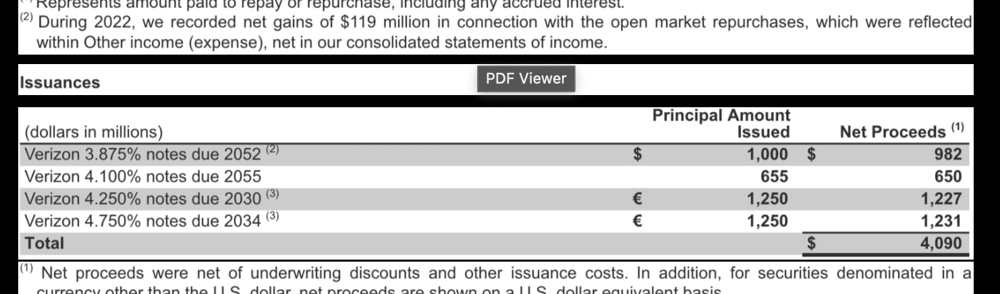

IndexError: list index out of range

In [22]:
unbordered_table = cv2.imread("/content/Multi_Type_TD_TSR/images/Screenshot 2024-11-20 at 10.16.32 PM.jpg")
list_table_boxes = []

table_list = [unbordered_table]

for table in table_list:
    finalboxes, output_img = tsrwol.recognize_structure(table)
    list_table_boxes.append(finalboxes)

#Table Structure Recognition Partially Bordered Tables

TABLE 0 :


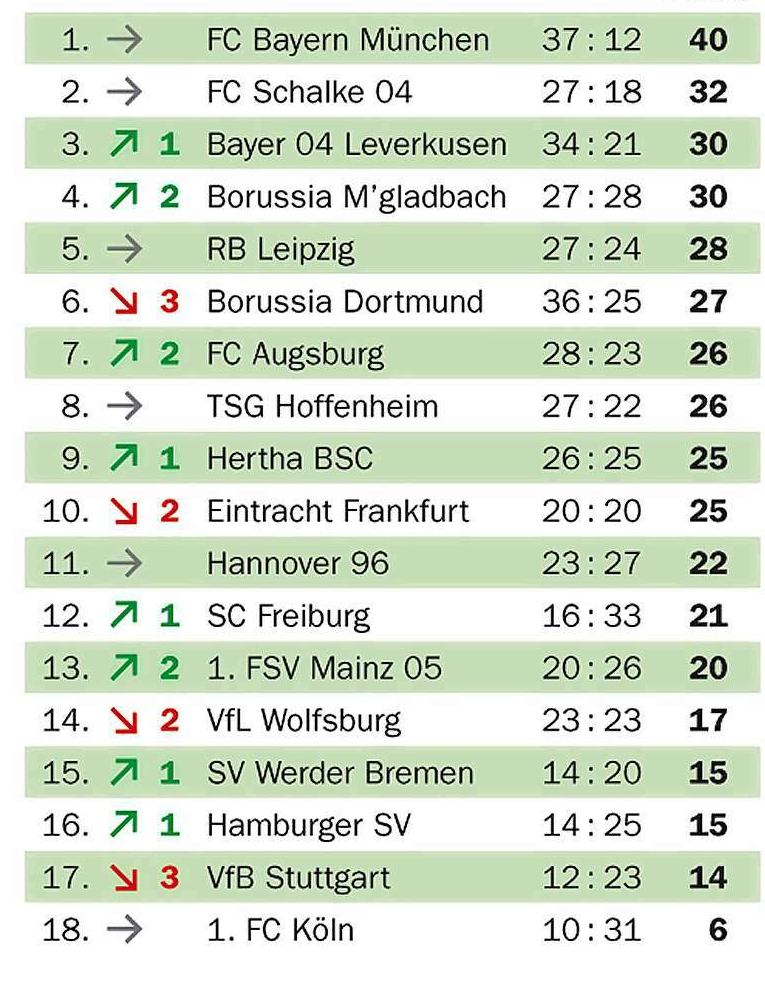


TABLE 1 :


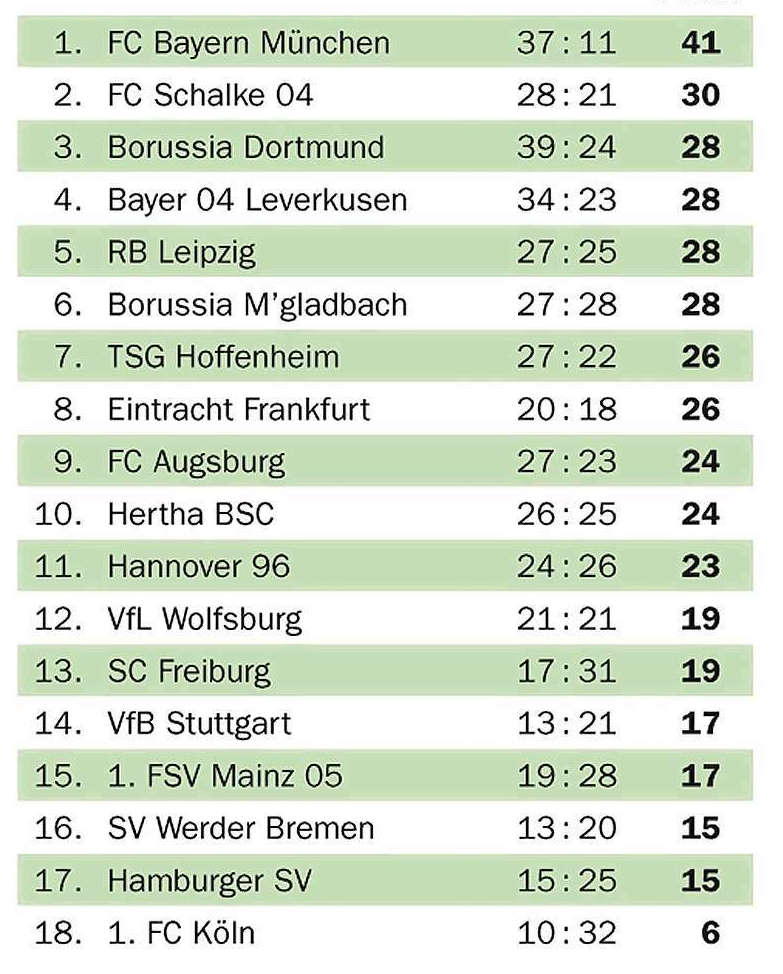

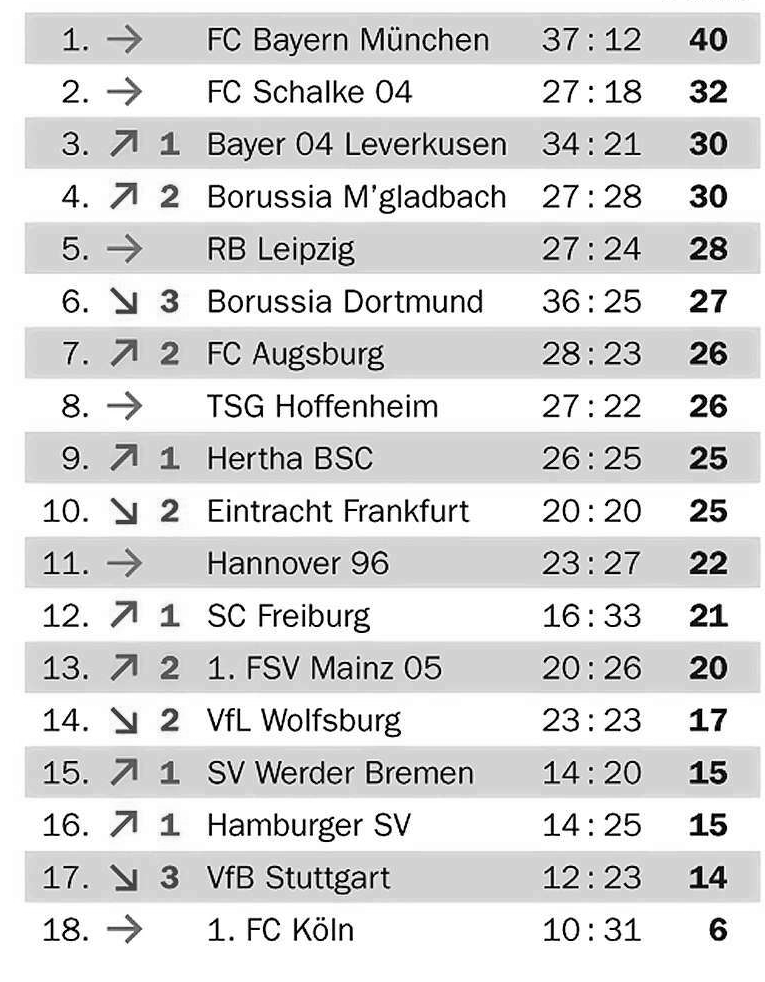

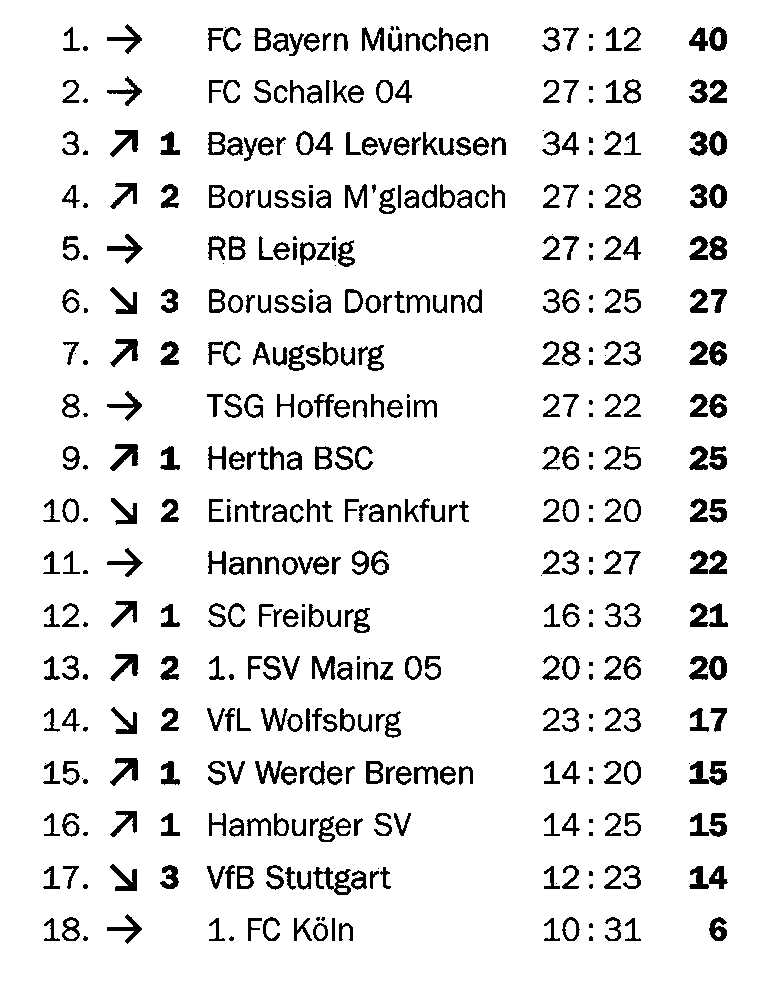

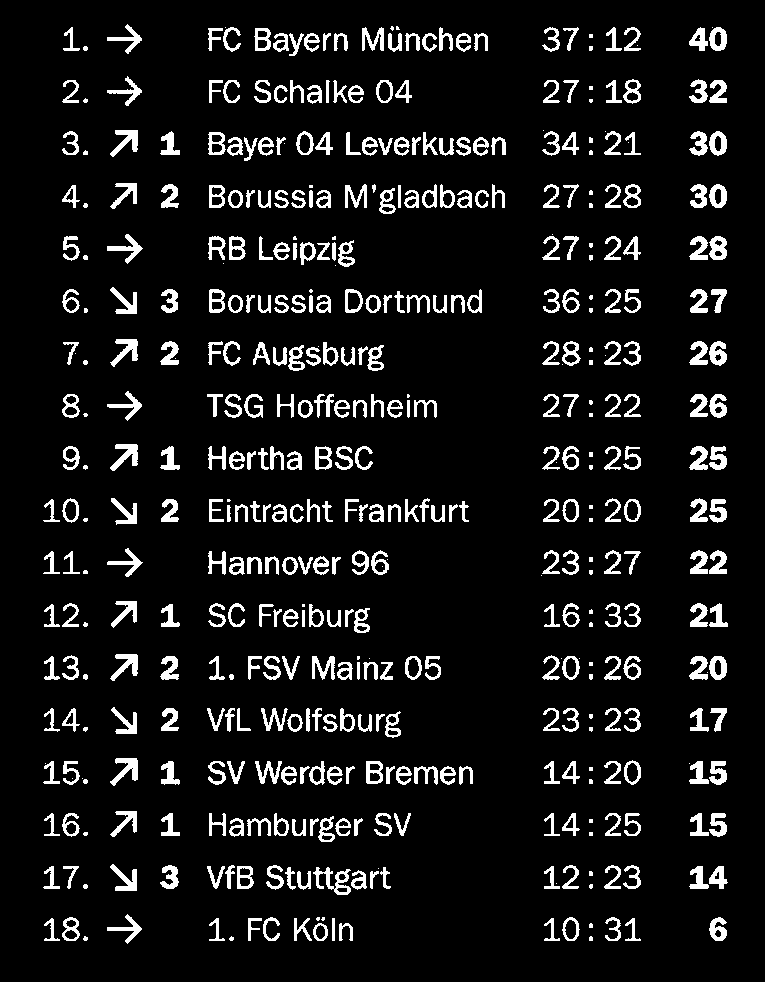

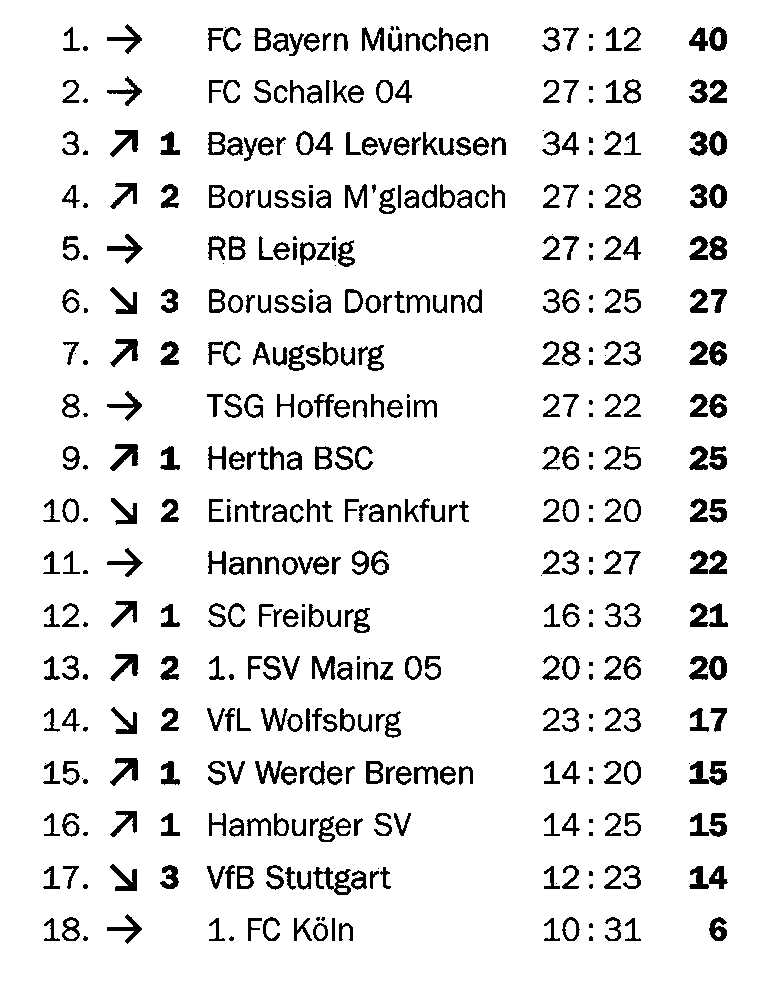

...

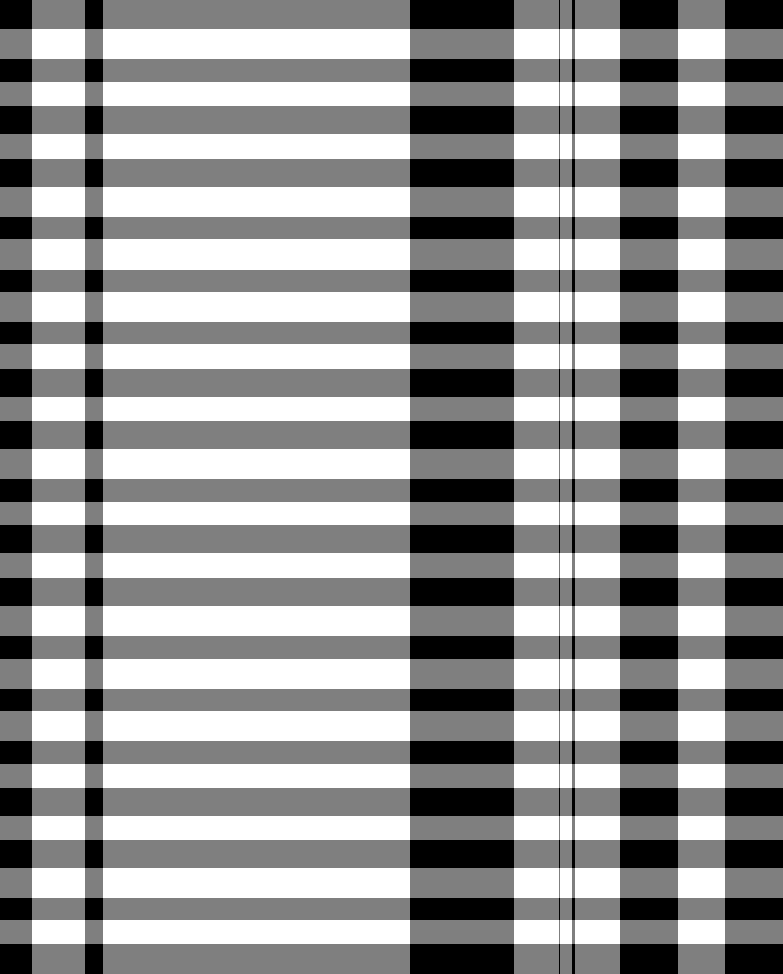

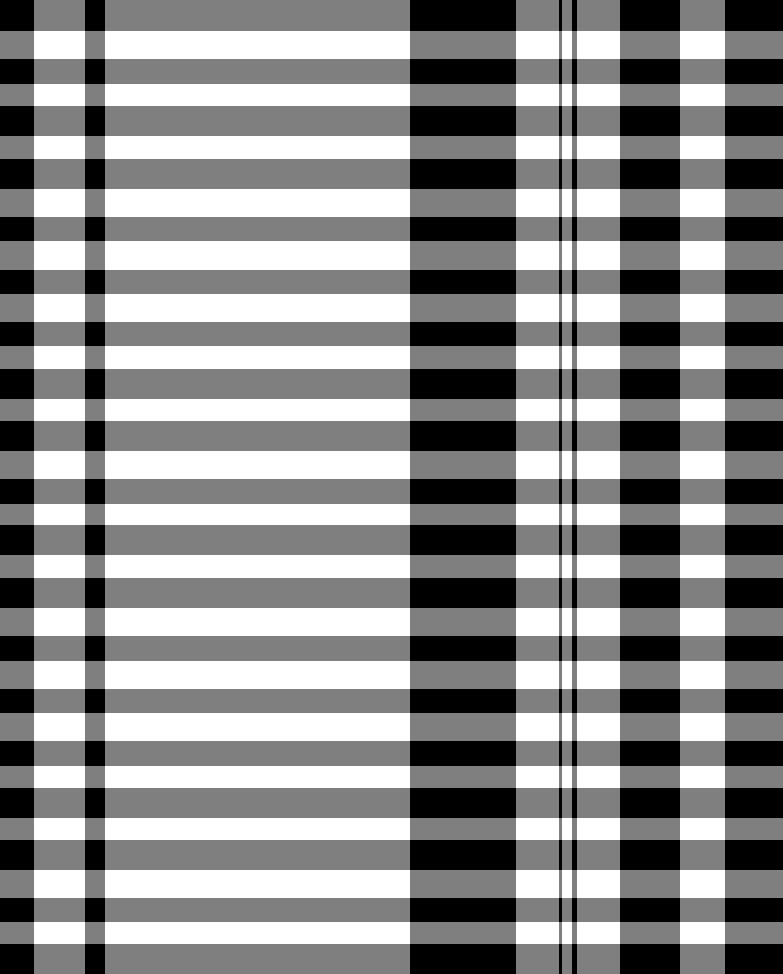

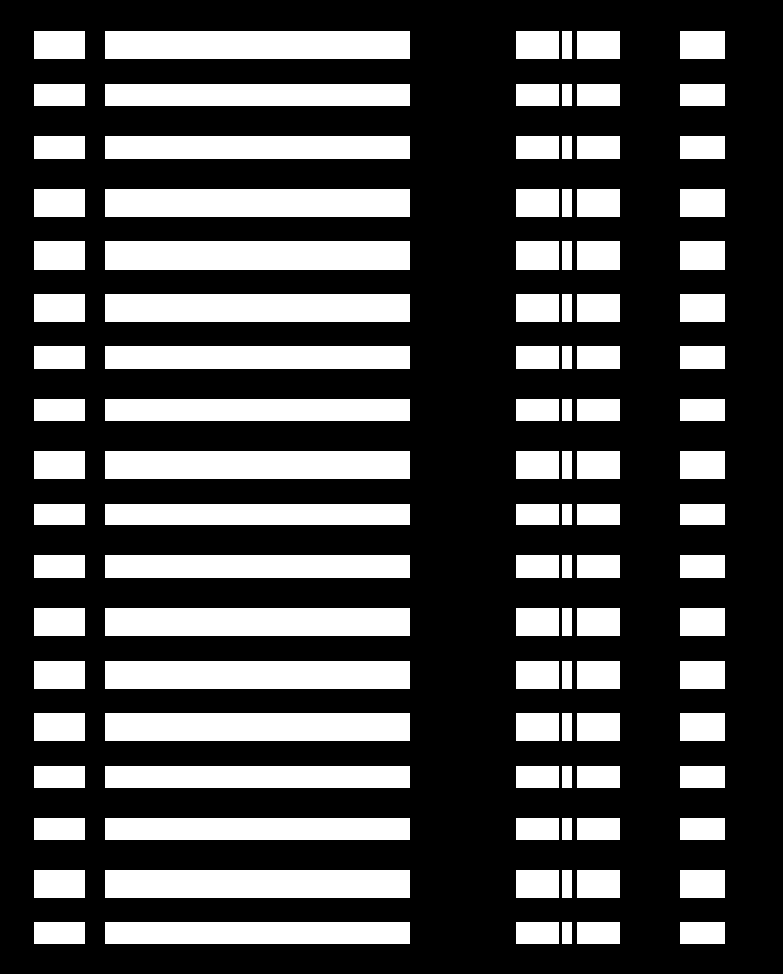

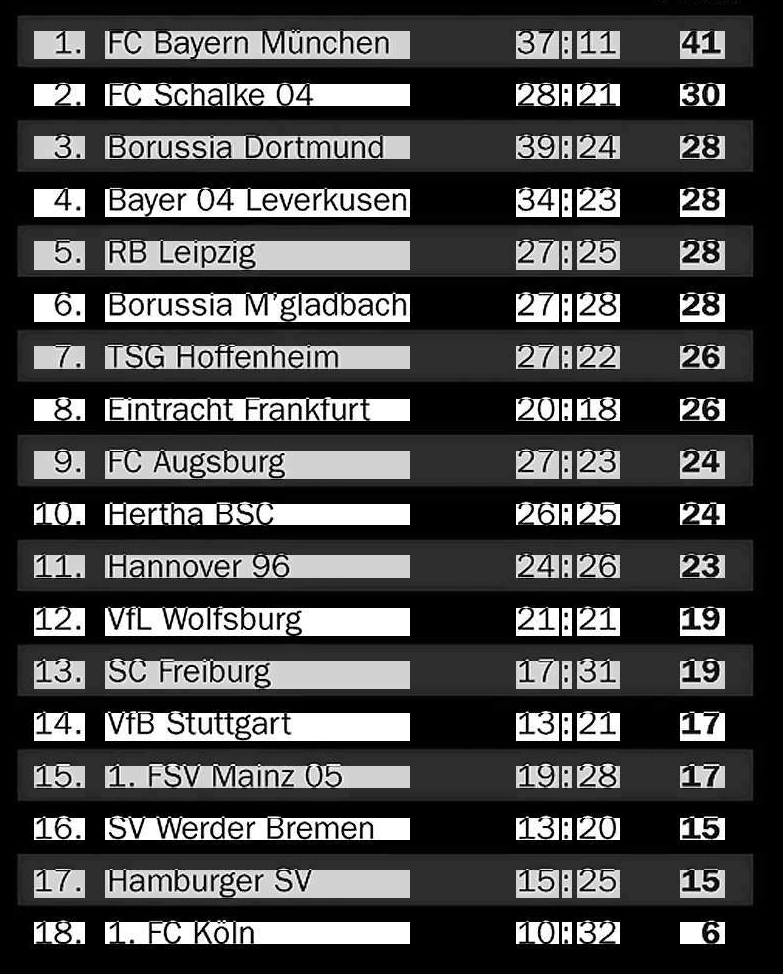

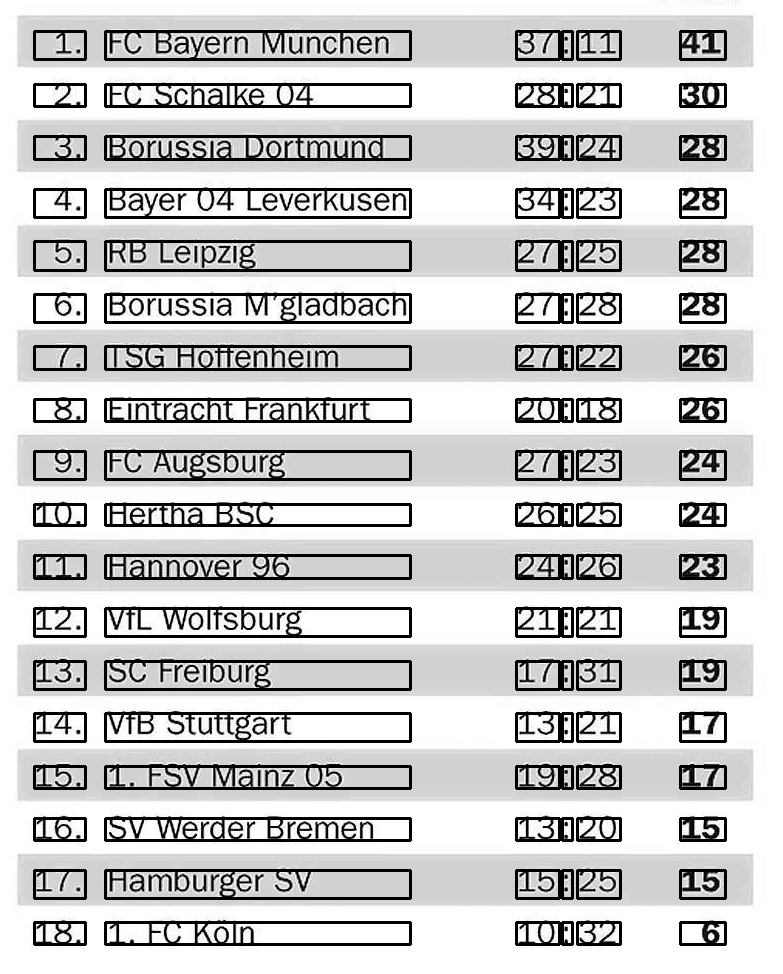

In [15]:
document_example = cv2.imread("/content/Multi_Type_TD_TSR/images/example.jpg")

table_list, table_coords = table_detection.make_prediction(document_example, predictor)
list_table_boxes = []
for table in table_list:
    finalboxes, output_img = tsrlwol.recognize_structure(table)
    list_table_boxes.append(finalboxes)